In [1]:
import os,sys
import scanpy as sc
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.serif'] = ['Arial']
sc.settings.set_figure_params(dpi=100,dpi_save=300,facecolor='white',frameon=False,fontsize=10,vector_friendly=True,figsize=(3,3))
sys.path.insert(
    0,
    '/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/script/spatial_pipeline/lib/utils'
)
from utils import getDefaultColors, removeBiasGenes, getDEG

ModuleNotFoundError: No module named 'utils'

In [ ]:
od = '/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v3/2.7_big_cell_scvi_cluster/All'
os.makedirs(od, exist_ok=True)
os.chdir(od)

In [ ]:
adata = sc.read('adata_big_cell_scvi.h5ad')

In [ ]:


'''
Description: 
Author: gongchanghao
Date: 2023-09-15 16:24:40
LastEditTime: 2023-09-20 16:57:32
LastEditors: gongchanghao
E-mail: gongchanghao@genomics.cn
FilePath: /gongchanghao/script/spatial_pipeline/bin/cellbin_pipeline_v2/2.big_cell/2.8_big_cell_scvi_cluster.ipynb
'''
region_map = {
    "Tumor_Cell_region_1": 'TCR1',
    'Tumor_Cell_region_2': 'TCR2',
    'Tumor_Cell_region_3': 'TCR3',
    'Tumor_Cell_region_4': 'TCR4',
    'Tumor_around_region_1': 'TAR1',
    'Tumor_around_region_2': 'TAR2',
    'Tumor_around_region_3': 'TAR3',
    'Tumor_around_region_4': 'TAR4',
    'Tumor_around_region_5': 'TAR5',
    'Mesenchymal_Cell_region_1': 'MCR1',
    'Mesenchymal_Cell_region_2': 'MCR2',
    'Mesenchymal_Cell_region_3': 'MCR3',
    'ADM_region_1': 'ADR1',
    'ADM_region_2': 'ADR2',
    'ADM_region_3': 'ADR3',
    'ADM_region_4': 'ADR4',
    'Acinar_Cell_region':'ACR',
    'Immune_Cell_region':'ICR',
}
adata.obs['region'] = adata.obs['community_type'].map(region_map)
# reorder categorical of region
adata.obs['region'] = pd.Categorical(adata.obs['region'], categories=sorted(region_map.values()), ordered=True)

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_tools/scatterplots.py:396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_tools/scatterplots.py:396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_tools/scatterplots.py:396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_tools/scatterplots.py:396: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/softw

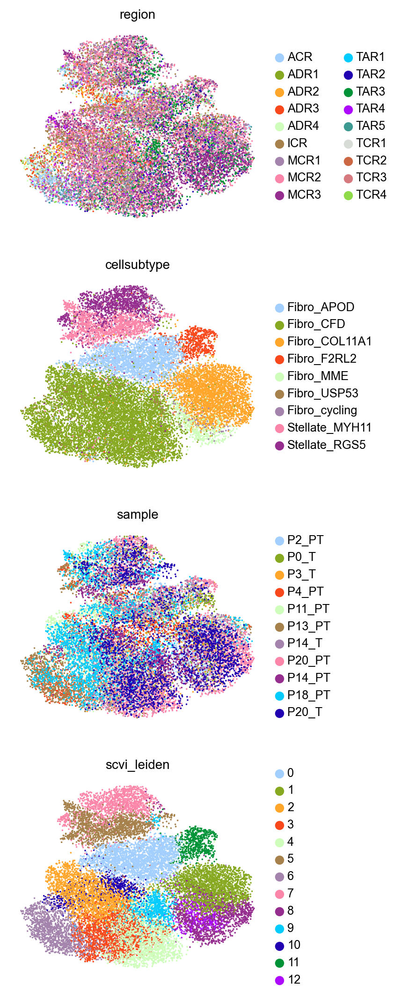

In [10]:
# SCVI_LATENT_KEY = "X_scVI"
# sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)
# sc.tl.leiden(adata,key_added='scvi_leiden')
# sc.tl.umap(adata)
colors = getDefaultColors(16,type=9)
colors2 = getDefaultColors(16,type=10)
sc.pl.umap(adata, color=["region",'cellsubtype','sample','scvi_leiden'],save='_region_scvi.pdf',ncols=1,palette=colors+colors2)

In [44]:
adata2 = sc.read('/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/cellbin_v3/2.1_merge_big_cell_community/all_merged_adata.h5ad')
adata2 = removeBiasGenes(adata2)
adata2 = adata2[adata.obs_names,:]
adata2.obsm['X_scVI'] = adata.obsm['X_scVI']
adata2.obsm['X_umap'] = adata.obsm['X_umap']
adata2.obs = adata.obs
adata = adata2.copy()
GMlist = ['GM{}'.format(i) for i in range(1, 31)]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
gene_module = pd.read_csv("/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/project/PDAC/spatial/binbase/NMF_merge_correlation5/gene_module.xls",sep='\t',index_col=0,header=0)
gene_module = gene_module.iloc[gene_module.index.isin(adata.var_names),:]
adata = adata[:,adata.var_names.isin(gene_module.index)]
adata = adata[:,gene_module.index]
X = adata.X.toarray().T
W = gene_module.values
res = np.linalg.lstsq(W, X, rcond=None)
H = res[0] 
from sklearn.preprocessing import scale
data = H.T
# 缩放处理
scaled_data = scale(data, axis=0)
nmfs = gene_module.columns
h_matrix = pd.DataFrame(scaled_data,index=adata.obs_names,columns=nmfs)
adata2.obs[nmfs] = h_matrix

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


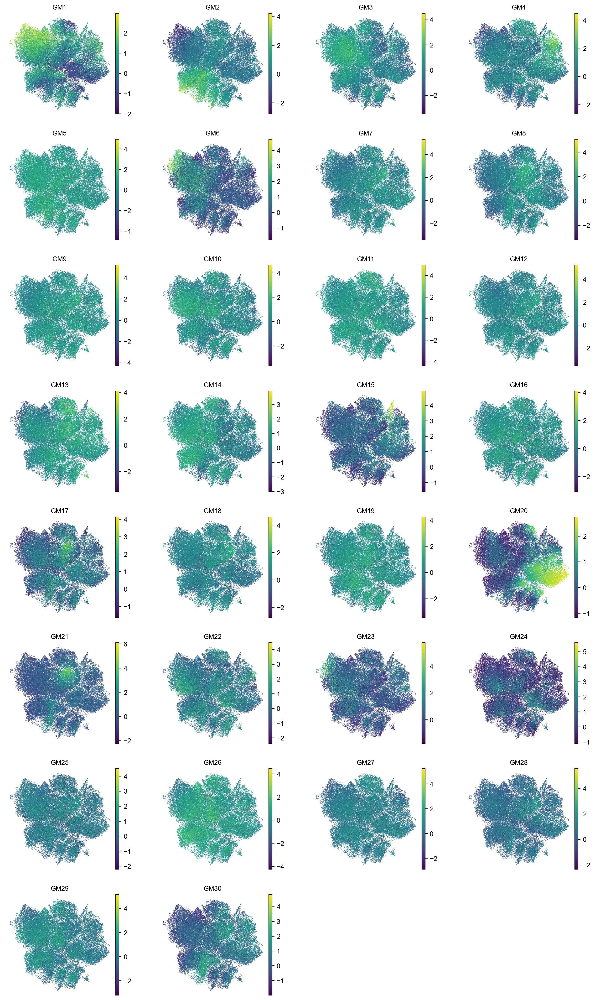

In [45]:
sc.pl.umap(adata2, color=GMlist,save='nmfs_region_scvi.pdf',ncols=4)

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/tools/_rank_genes_groups.py:577: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


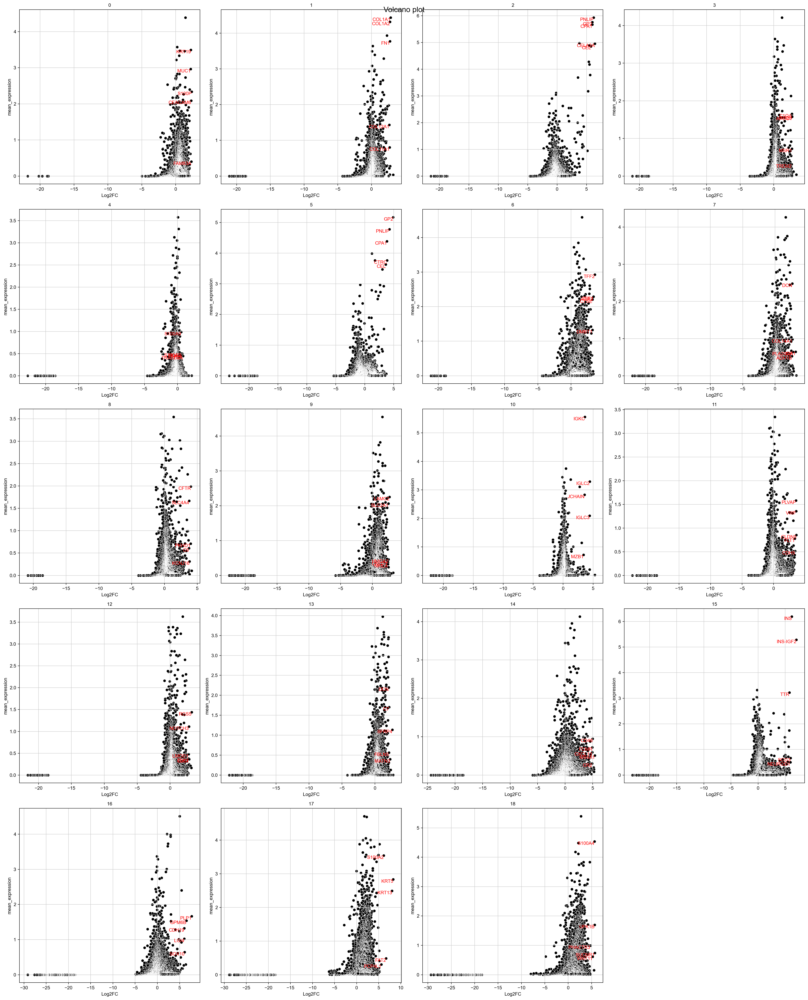

In [46]:
sc.pp.normalize_total(adata2, target_sum=1e4)
sc.pp.log1p(adata2)
adata2 = removeBiasGenes(adata2)
sc.tl.rank_genes_groups(adata2,
                        'scvi_leiden',
                        method='wilcoxon',
                        use_raw=False,
                        # layer='norm',
                        key_added='rank_genes_groups')
DEG_dict = getDEG(adata2,
                    'scvi_leiden',
                    qval_cutoff=0.05,
                    mean_expr_cutoff=0.3,
                #   layer='norm',
                    top_genes=200,
                    save=f'DEG_volcano_scvi_leiden_all.png')

In [47]:
degfl = open(f"DEG_scvi_leiden.xls", 'w')
for key, value in DEG_dict.items():
    degfl.write(key + '\t' + '\t'.join(value) + '\n')
degfl.close()
result = adata2.uns['rank_genes_groups']
groups = result['names'].dtype.names
df = pd.DataFrame({
    group + '_' + key: result[key][group]
    for group in groups
    for key in ['names', 'logfoldchanges', 'pvals', 'pvals_adj']
})
df.to_csv(f'DEG_wolcoxon_scvi_leiden.csv')

/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/scanpy/scanpy/plotting/_utils.py:292: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  pl.savefig(filename, dpi=dpi, bbox_inches='tight')
meta NOT subset; don't know how to subset; dropped
/jdfsbjcas1/ST_BJ/P21H28400N0232/gongchanghao/software/miniconda/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


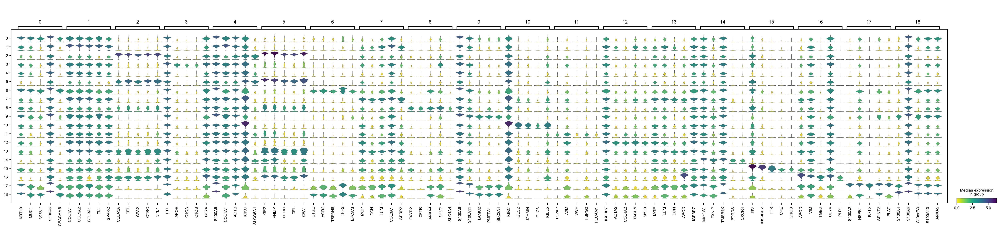

In [50]:
sc.pl.rank_genes_groups_stacked_violin(adata2,n_genes=5, cmap='viridis_r',save='scvi_leiden_deg.pdf',swap_axis=True,dendrogram=False)
